In [1]:
*** Settings ***
Library  BuiltIn
Library  Autosphere.Tables
Library  Autosphere.Excel.Files
Library  Autosphere.Browser.Playwright
Library  ConfigrationFile.py

Test Setup  Open the browser
Test Teardown  Close the browser


In [2]:
*** Variables ***
${ExcelPath}
${configFile}=  config.ini  
${IniData}=  DATA


In [3]:
*** Keywords ***
Open ExcelFile 
    Open workbook  ${ExcelPath}
    ${tab}=  Read Worksheet As Table  Sheet1  header=True
    [Return]  ${tab}

Open the browser 
    Open Available Browser  https://stardex.com.ng/HR-On-boarding-Process-Form/  maximized= True
    
Form filling loop
    [Arguments]  ${tab}
    Set Global Variable  @{row}  ' '
    ${count} =  Get Length  ${tab}
    FOR  ${r}  IN RANGE  0  ${count}
         @{row}=  Get Table Row  ${tab}  ${r}  as_list=${TRUE}
        Fill the Form  ${tab}  ${row}
        Check the field required message found
        sleep  2
    END

Fill the Form
    [Arguments]  ${tab}  ${row}
    Input Text  (//*[@id="wpcf7-f1759-p1756-o1"]//input)[7]  ${row}[0]   
    Input Text  (//*[@id="wpcf7-f1759-p1756-o1"]//input)[8]  ${row}[1]
    Input Text  (//*[@id="wpcf7-f1759-p1756-o1"]//input)[9]  ${row}[2]
    Input Text  (//*[@id="wpcf7-f1759-p1756-o1"]//input)[10]  ${row}[3]
    Input Text  (//*[@id="wpcf7-f1759-p1756-o1"]//input)[11]  ${row}[4]
    Input Text  (//*[@id="wpcf7-f1759-p1756-o1"]//input)[12]  ${row}[5]
    Input Text  (//*[@id="wpcf7-f1759-p1756-o1"]//input)[13]  ${row}[6]
    # Select option from drop down
    Click Element  //option[contains(text(),'${row}[7]')]
    Select Checkbox  //*[@id="wpcf7-f1759-p1756-o1"]/form/div[2]/div/div[9]/div/p/span/span/span/label/input
    Click Button  //*[@id="wpcf7-f1759-p1756-o1"]/form/div[2]/div/div[10]/button
        
Check the field required message found 
    ${stat} =  Run Keyword And Return Status  Page Should Contain Element  (//*[@class="wpcf7-not-valid-tip"])
    IF  '${stat}' == 'True'
        Fill the Form  ${tab}  ${row}
    END 

Close the browser
    Close Browser


Box(children=(Button(description='Open ExcelFile', style=ButtonStyle()),), layout=Layout(display='flex', flex_…

Output()

Box(children=(Button(description='Open the browser', style=ButtonStyle()),), layout=Layout(display='flex', fle…

Output()

Box(children=(Button(description='Form filling loop', style=ButtonStyle()), Label(value='tab='), Text(value=''…

Output()

Box(children=(Button(description='Fill the Form', style=ButtonStyle()), Label(value='tab='), Text(value=''), L…

Output()

Box(children=(Button(description='Check the field required message found', style=ButtonStyle()),), layout=Layo…

Output()

Box(children=(Button(description='Close the browser', style=ButtonStyle()),), layout=Layout(display='flex', fl…

Output()

<a href="about:" onClick="javascript:(function(el){var w=window.open();var d='PCFET0NUWVBFIGh0bWw+DQo8aHRtbCBsYW5nPSJlbiI+DQo8aGVhZD4NCjxtZXRhIGh0dHAtZXF1aXY9IkNvbnRlbnQtVHlwZSIgY29udGVudD0idGV4dC9odG1sOyBjaGFyc2V0PXV0Zi04Ij4NCjxtZXRhIGh0dHAtZXF1aXY9IlByYWdtYSIgY29udGVudD0ibm8tY2FjaGUiPg0KPG1ldGEgaHR0cC1lcXVpdj0iRXhwaXJlcyIgY29udGVudD0iLTEiPg0KPG1ldGEgaHR0cC1lcXVpdj0iWC1VQS1Db21wYXRpYmxlIiBjb250ZW50PSJJRT1lZGdlIj4NCjxtZXRhIGNvbnRlbnQ9IlJvYm90IEZyYW1ld29yayA0LjEgKFB5dGhvbiAzLjcuNSBvbiB3aW4zMikiIG5hbWU9IkdlbmVyYXRvciI+DQo8bGluayByZWw9Imljb24iIHR5cGU9ImltYWdlL3gtaWNvbiIgaHJlZj0iZGF0YTppbWFnZS94LWljb247YmFzZTY0LEFBQUJBQVVBRUJBQUFBRUFJQUJvQkFBQVZnQUFBQmdZQUFBQkFDQUFpQWtBQUw0RUFBQWdJQUFBQVFBZ0FLZ1FBQUJHRGdBQU1EQUFBQUVBSUFDb0pRQUE3aDRBQUplV0FBQUJBQ0FBeUcwQkFKWkVBQUFvQUFBQUVBQUFBQ0FBQUFBQkFDQUFBQUFBQUFBRUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBSXVqa0FDWUJEc0FqUmhDRDZFWVNXQ25HRSs4cVJoUTdhMFhVZitzRjFIN3FSbFEzcVVZVHA2YkdVazdkQlU2QTRZWFFRQUFBQUFBQUFBQUFGSVBJUURLR0dFQW1CbEtLcWdZVUsydUYxSDJyeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML3F4ZFE1cUlYVEhxU0cwVU1tQmRHQUFBQUFBQ2ZGVTBBbGhWSUxLWVhVYzZ2R0ZQL3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit1RjFINnBSaE9qb2tZUUFxU0dFUUFqQlJBRXFjV1VMS3ZGMVAvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82MFhVZm1oRjB4cC95RitBS0FXU211c0YxSDRzQmRTLzY4V1V2K3ZGbEwvcnhkUy82OFdVZit2RjFML3J4ZFMvNjhXVWYrdkYxTC9yeGRTLzY4WFV2K3ZGbEwvcWhkUTFaVVhSQ09vSkZmTHNTRlkvNjBVVHYreElGci9zUjlZLzdBZVZ2K3lKbDMvcmhoUy83QVhVdit6SWxyL3NSMVgvNjRXVWYrdkcxWC9zeWRkLzY4YVV2dWtHRXB3dmxaLyt0eWh1di9HWTRuLzI2QzUvOGh3bFAvY283di81YnZNLzhoc2tQK3VGMUgvMUlhbC84RlRmLyt6S0Y3LzJacXkvK1c1eS8vU2lLWC9weWxac2JJclgvL253OUgvNDczTC8rZkMwZi9UaTZmLzJaMjIvOEphZ2YvbHZNei9zU1JiLzltYnRQL0RXNFgvelhHVy85eWx1ZiszTzJ2LzQ3VEcvOGgzbDhhc0ZVLy96WGlaLys3VzRQL05mSnYvMG9HZy85S0JvUCsyTG1QLzVydk0vNzlNZS8vaXNNVC96MzJlLzlTR3BmL2NwYnYvdWtGdi8rTzF4Ly9HZEpURnJSWlErTGsyYWYvY29MZi90elpvLzhobGpmL0laNDMvdFNsZi85aVVzUC9VamFyLzRyREYvOStyd1AvSWFvei8xcE9zLytTM3lmL1JncUQvcFNoV3I2WVlUY2l2R0ZIL3NCbFQvNjhYVXYrd0cxWC9yeHRWLzY4WVV2K3hIVmIvc0J0Vi82OGJWZit2RzFYL3J4aFMvNjhhVS8reUkxdi9yaGhSK3A4VlNtMmNGMGxxckJoUjk2OFlVLyt2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML3J4WlMvNmtZVDlDVUcwTWdneFk4RUtVWlRxNnZHRlAvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82MFhVZmVnRmt4ajFSVmtBS01YVUFDV0Zrb25weFpQeEs0WFVmK3ZGMUwvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzYwWFVmbWxGMHlLZ1JkRUNZd1pSd0JPRVMwQXJ4WlBBSlVVUnlXa0YwMmxyQmhRODY0V1V2K3ZGMUwvcnhkUy83QVhVdit3RjFML3NCaFIvcXdYVWVHaEYwMXdoeFkvQ3BFV1F3QUFBQUFBQUFBQUFBQVBBQUNaR0VnQWd4bEFESjhZU0ZXa0ZreXlxUmRQNUtvWFVQMnFGMUQ0cVJsUDFxTVpTNU9aRjBneWJSUXZBb1FXT2dBQUFBQUFBQUFBQU9BSEFBREFBd0FBZ0FFQUFBQUJBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUJBQUNBQVFBQXdBTUFBT0FIQUFBb0FBQUFHQUFBQURBQUFBQUJBQ0FBQUFBQUFBQUpBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFEc0VEQUNpSUVzQWdoYzFFNW9hU0Z1Z0dVMm5wQnBQMjZnV1QvbXRGMUgvcWhaUS9xZ1lUdW1pRzAvQW1oaEplNVFjUnk5V0RSMENjUlF3QUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFrU3RSQUlnclRnaVpHVWxUcHhkTHZxd1lVUGV2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcmhkUi9hb1lUK0NkR0VxRmloTkJIcXdjVVFCVEJ5d0FBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUNiRzAwQWhCdENGcUFZVFpDdEdGUDFzQmRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3VGMUwvcFJkTnlwVVpSVDZzSGxNQWpCZytBQUFBQUFBQUFBQUFBQUFBQUlNU1BnQjdFRGtablJkTnJhMFlVLzZ3R0ZQL3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzZrWVVOeVpHa3BGd3lCaEFIQVlOZ0FBQUFBQWdoSkFBSE1STndtaUZrMlZyQmRVLzY0WFUvK3ZGMUwvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrb0dFL1lqeGRFTko4WlN3QS9DaDRBdkJkYUFKZ1ZSMStzRmxQM3NCZFQvN0FYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML294ZE5zSGdVT2crQkZENEFpaFJBR3FZWVRzZXVGMVAvc1JkUy83QVhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeGRTLzY4WFV2K3ZGMUwvcnhkUy82OFhVdit2RjFML3J4ZFMvNjhYVXYrdkYxTC9yeG

Output from **Create Table**

<table class='rpafw-notebook-table'><tr><th>Employee ID</th><th>Email</th><th>First Name</th><th>Last Name</th><th>Date of birth</th><th>Designation</th><th>Phone Number</th><th>Gender</th></tr><tr><td>3567</td><td>ZacharyBDunn@rhyta.com</td><td>Dunn</td><td>Zachary </td><td>1954-11-24 00:00:00</td><td>Information systems manager</td><td>419-637-4864</td><td>Male</td></tr><tr><td>2880 </td><td>GeorgeNOtwell@teleworm.us</td><td>Otwell</td><td>George </td><td>1942-07-09 00:00:00</td><td>Braille clerk</td><td>850-776-2856</td><td>Male</td></tr><tr><td>1881</td><td>TimothyMAbramowitz@armyspy.com</td><td>Abramowitz</td><td>Timothy</td><td>1953-12-02 00:00:00</td><td>Floor broker</td><td>425-407-7919</td><td>Male</td></tr><tr><td>786</td><td>SteveLWestfall@jourrapide.com</td><td>Westfall</td><td>Steve</td><td>1957-12-22 00:00:00</td><td>Fish cleaner</td><td>732-476-2205</td><td>Others</td></tr><tr><td>2615 </td><td>ClaraRNelson@armyspy.com</td><td>Clara</td><td>Nelson</td><td>1994-02-12 00:00:00</td><td>Instructional coach</td><td>605-565-7568</td><td>Female</td></tr><tr><td>2226 </td><td>HildaBHernandez@rhyta.com</td><td>Hilda </td><td>Hernandez</td><td>1966-12-02 00:00:00</td><td>Watch repairer</td><td>313-980-3154</td><td>Female</td></tr><tr><td>1209 </td><td>BryanHGriffin@armyspy.com</td><td>Bryan </td><td>Griffin</td><td>1948-09-28 00:00:00</td><td>Technologist</td><td>301-772-4261</td><td>Others</td></tr><tr><td>1412 </td><td>ThomasMMoore@jourrapide.com</td><td>Thomas </td><td>Moore</td><td>2002-08-06 00:00:00</td><td>Insulation worker</td><td>956-493-2605</td><td>Male</td></tr><tr><td>1793</td><td>BerniceFSpady@rhyta.com</td><td>Bernice </td><td>Spady</td><td>1942-08-27 00:00:00</td><td>Taxi driver</td><td>727-347-7069</td><td>Others</td></tr><tr><td>2237 </td><td>BruceDHancock@dayrep.com</td><td>Bruce </td><td>Hancock</td><td>1996-10-03 00:00:00</td><td>Family and general practitioner</td><td>931-583-8491</td><td>Male</td></tr></table><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

Output from **Get Table Row**

<span class='rpafw-notebook-text'>None</span><br>

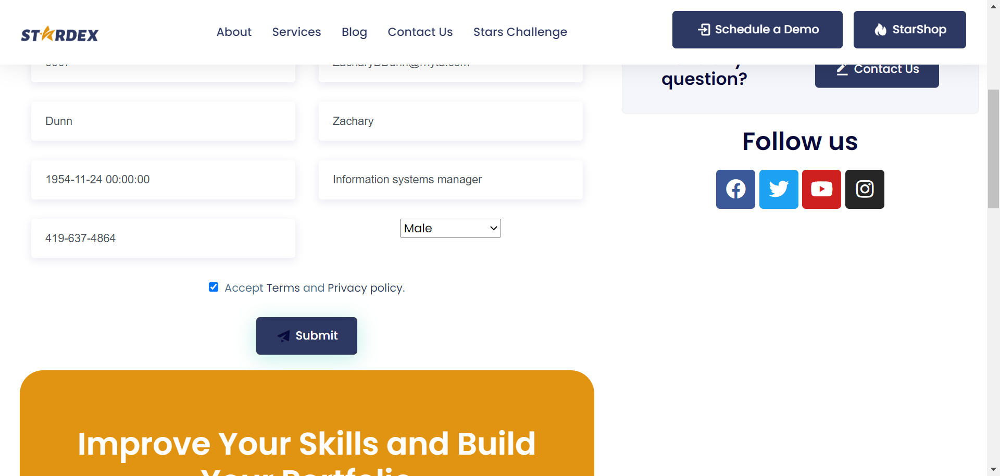

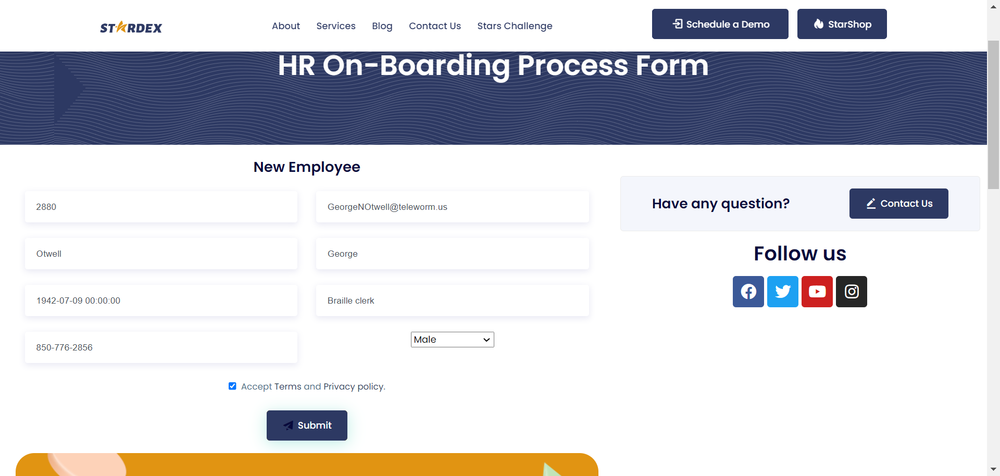

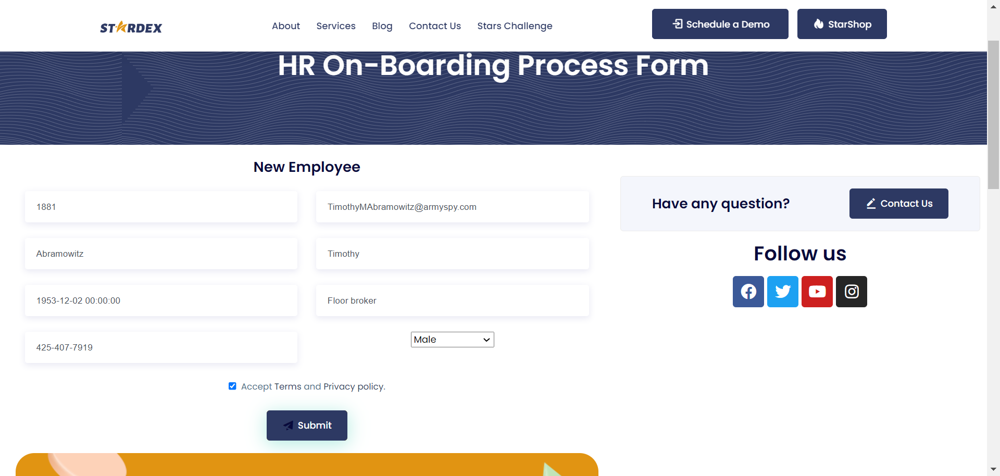

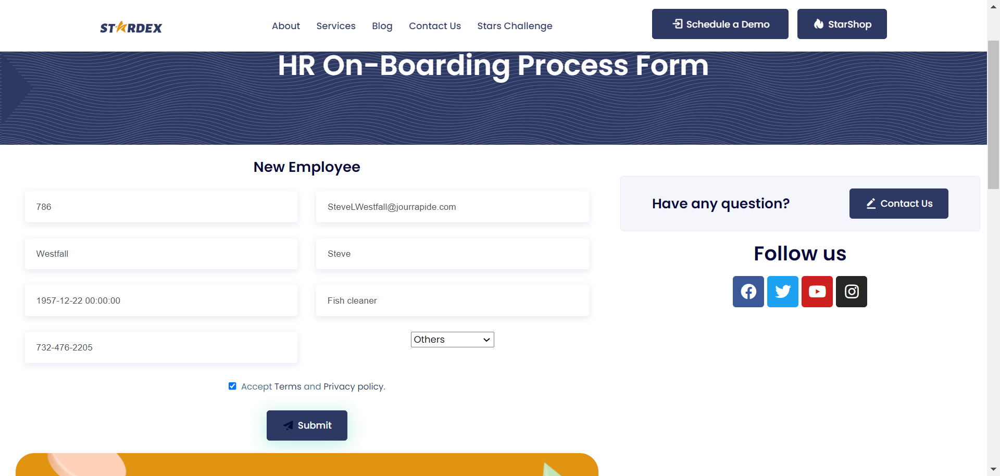

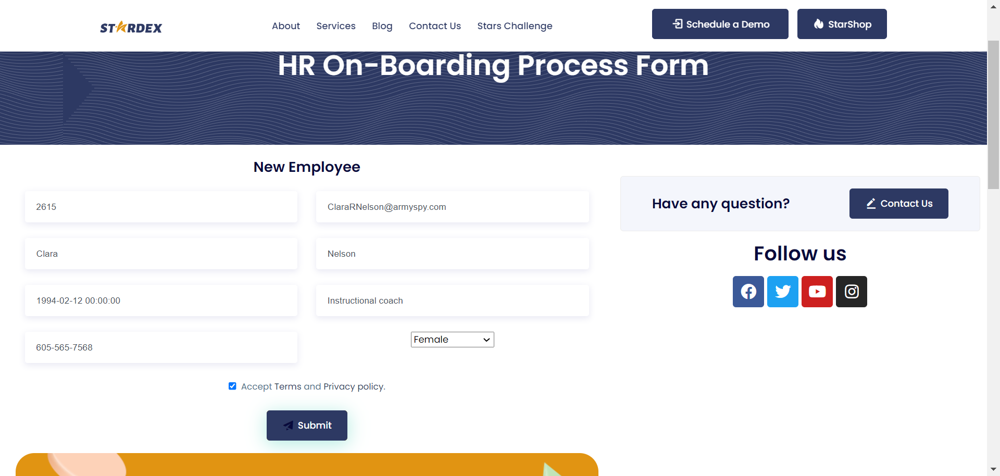

...

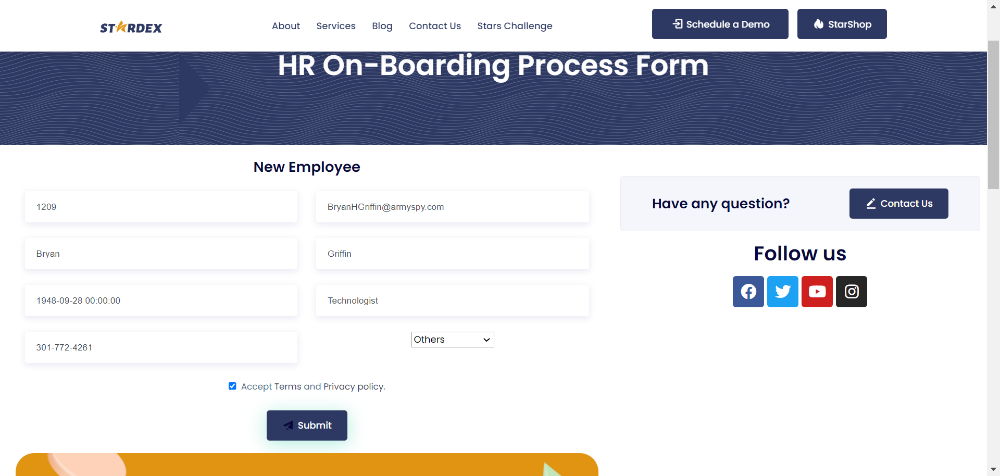

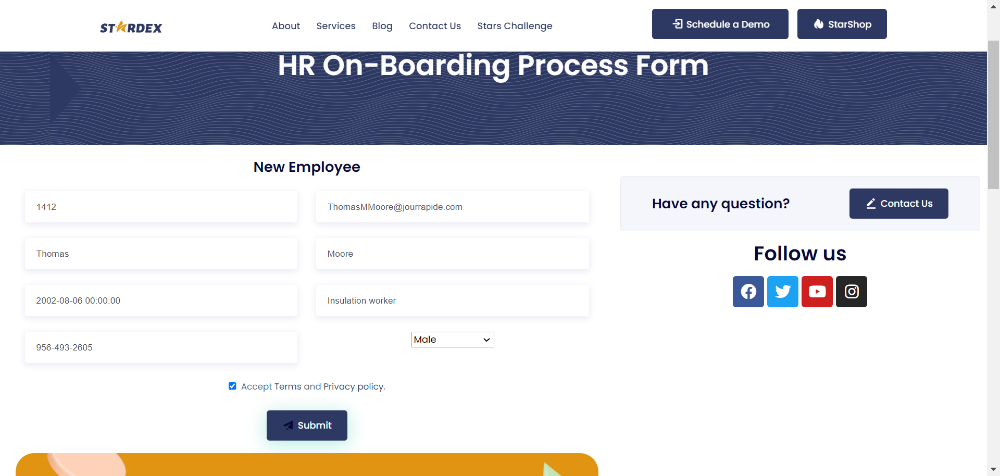

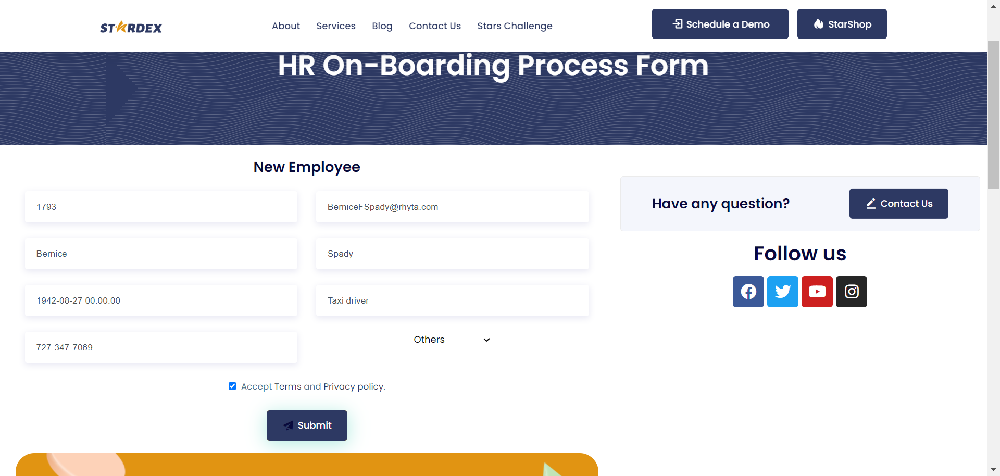

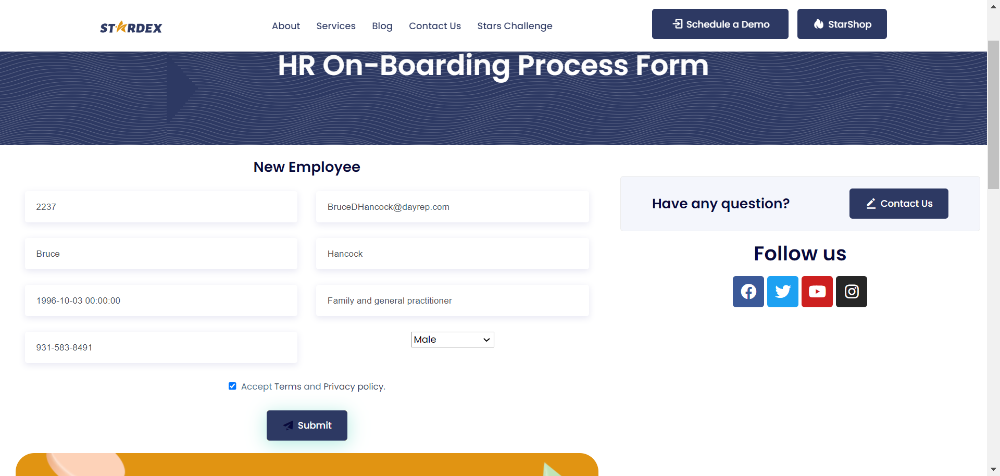

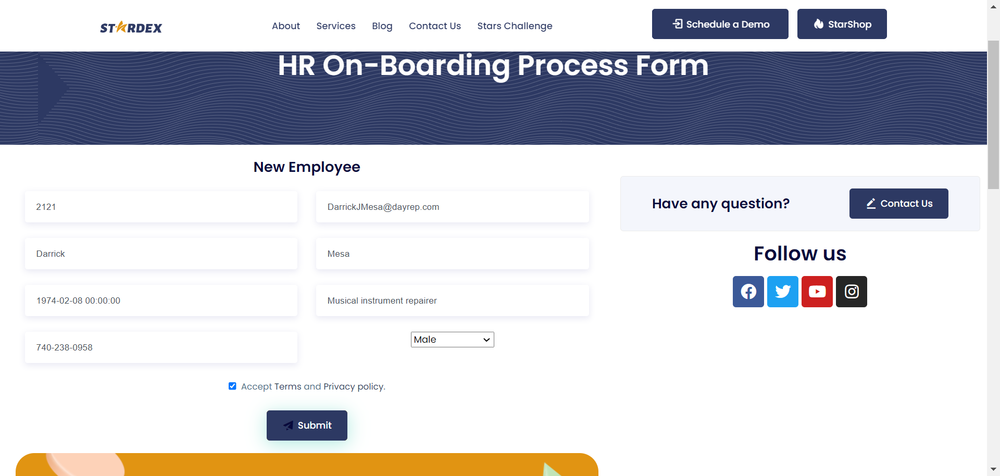

In [4]:
*** Tasks ***
Star can code day2
    ${ExPath}=  Get Value From Config File  ${configFile}  ${IniData}  path
    Set global variable  ${ExcelPath}  ${ExPath} 
    
    ${tab}  Open ExcelFile
    Form filling loop  ${tab}